In [1]:
import h5py
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import numpy as np

In [13]:
file = '/data/fast1/das4orcas_prelim/decimator_2024-10-25_23.44.00_UTC_006608.h5'

data = h5py.File(file)
attrs=dict(data['Acquisition'].attrs)
das = np.array(data['Acquisition/Raw[0]/RawData'])
time = np.array(data['Acquisition/Raw[0]/RawDataTime'])
data.close()
dt = 1/attrs['MaximumFrequency']/2
dx = attrs['SpatialSamplingInterval']
nt,nx = data_hf.shape

x = np.linspace(0,nx*dx,nx)
t = np.linspace(0,nt*dt,nt)

In [12]:
b,a = butter(2,10,'high',fs=1/dt)
data_hf = filtfilt(b,a,das,axis=0)

2000.0

# Is that a whale?

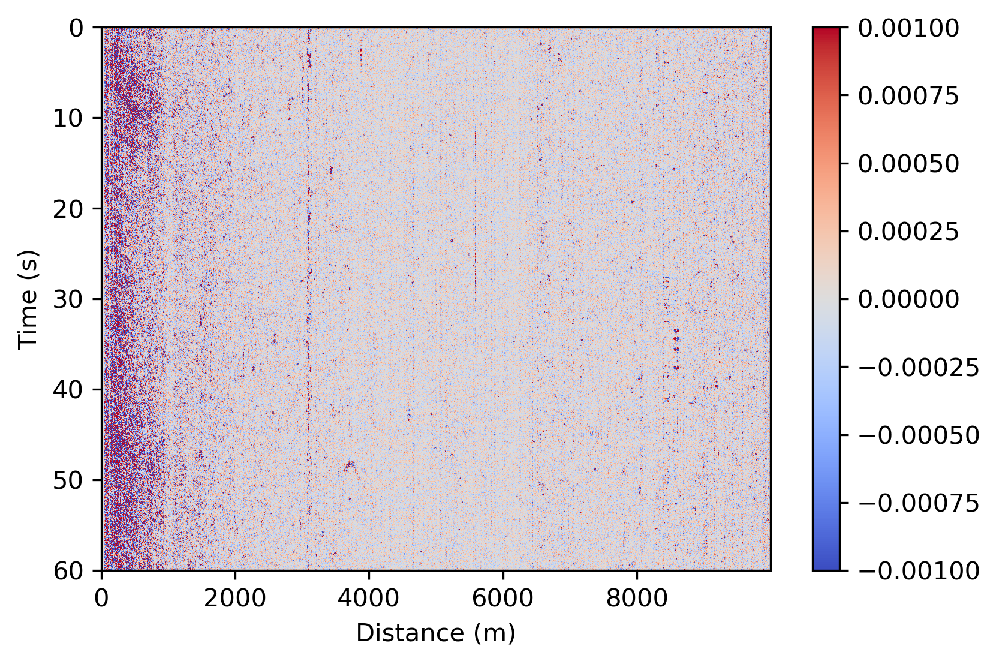

In [52]:
vm = 0.001
plt.subplots(dpi=300)
c=plt.imshow(data_hf,aspect='auto',cmap='coolwarm',
             vmin=-vm,vmax=vm,extent=[x[0],x[-1],t[-1],t[0]])
plt.colorbar(c)
plt.xlabel('Distance (m)')
plt.ylabel('Time (s)')
# plt.savefig(file+'.png')
plt.show()

# zoom in

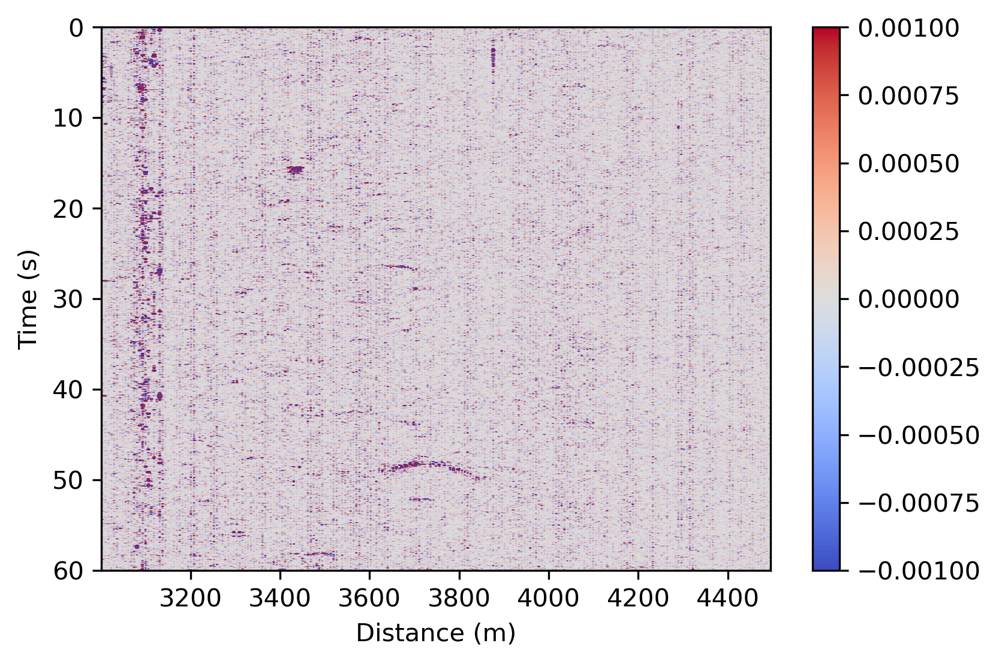

In [53]:
vm = 0.001

# Extract sliced data
time_slice = np.where((t >= 0) & (t <= 60))[0]
space_slice = np.where((x >= 3000) & (x <= 4500))[0]
data_sliced = data_hf[np.ix_(time_slice, space_slice)]

# Create the plot
plt.subplots(dpi=300)
c = plt.imshow(
    data_sliced,
    aspect='auto',
    cmap='coolwarm',
    vmin=-vm,
    vmax=vm,
    extent=[x[space_slice][0], x[space_slice][-1], t[time_slice][-1], t[time_slice][0]]
)

plt.colorbar(c)
plt.xlabel('Distance (m)')
plt.ylabel('Time (s)')
plt.show()

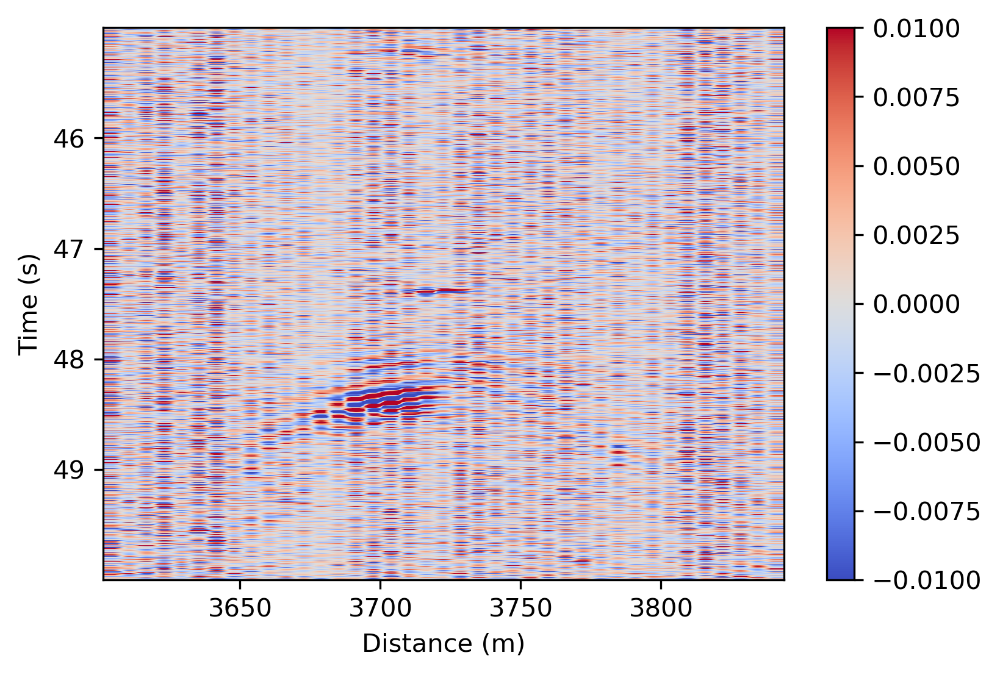

In [74]:
vm = 0.01

# Extract sliced data
time_slice = np.where((t >= 45) & (t <= 50))[0]
space_slice = np.where((x >= 3600) & (x <= 3850))[0]
data_sliced = data_hf[np.ix_(time_slice, space_slice)]

# Create the plot
plt.subplots(dpi=300)
c = plt.imshow(
    data_sliced,
    aspect='auto',
    cmap='coolwarm',
    vmin=-vm,
    vmax=vm,
    extent=[x[space_slice][0], x[space_slice][-1], 
            t[time_slice][-1], t[time_slice][0]]
)

plt.colorbar(c)
plt.xlabel('Distance (m)')
plt.ylabel('Time (s)')
plt.show()

In [110]:
# Extract sliced data
time_slice = np.where((t >= 45) & (t <= 50))[0]
space_slice = np.where((x >= 3600) & (x <= 3850))[0]
data_sliced = data_hf[np.ix_(time_slice, space_slice)]
data_sliced_nofilt  = das[np.ix_(time_slice, space_slice)]

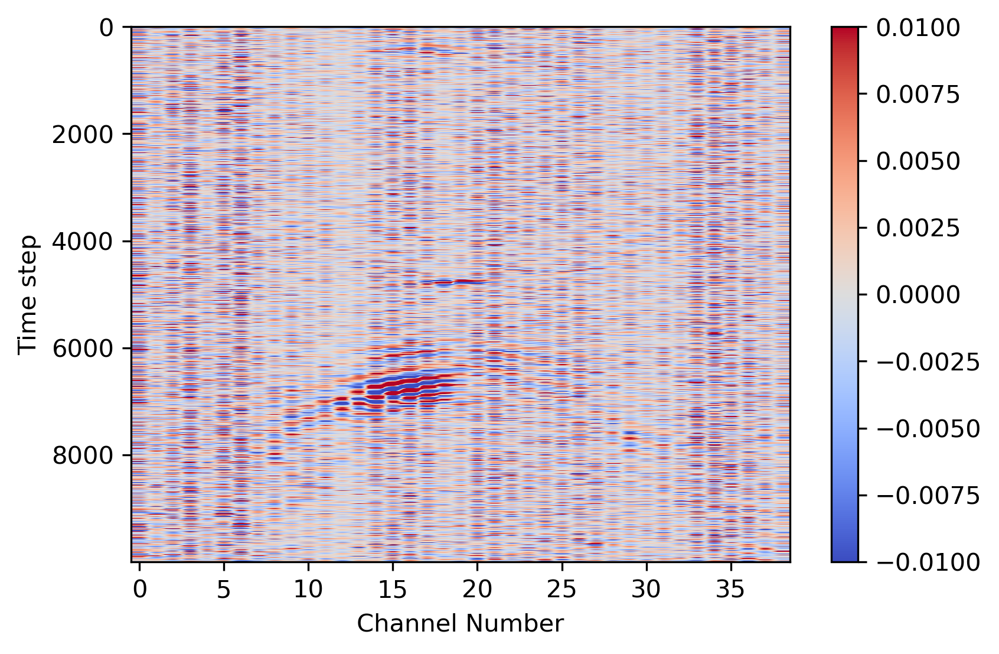

In [91]:
vm = 0.01

# Create the plot
plt.subplots(dpi=300)
c = plt.imshow(
    data_sliced,
    aspect='auto',
    cmap='coolwarm',
    vmin=-vm,
    vmax=vm,
)

plt.colorbar(c)
plt.xlabel('Channel Number')
plt.ylabel('Time step')
plt.show()

In [104]:
from scipy.fft import fft2,fftshift,fftfreq,fft

f = fftshift(fftfreq(data_sliced.shape[0], d=dt))
k = fftshift(fftfreq(data_sliced.shape[1], d=dx))


Text(0.5, 0, 'Frequency (Hz)')

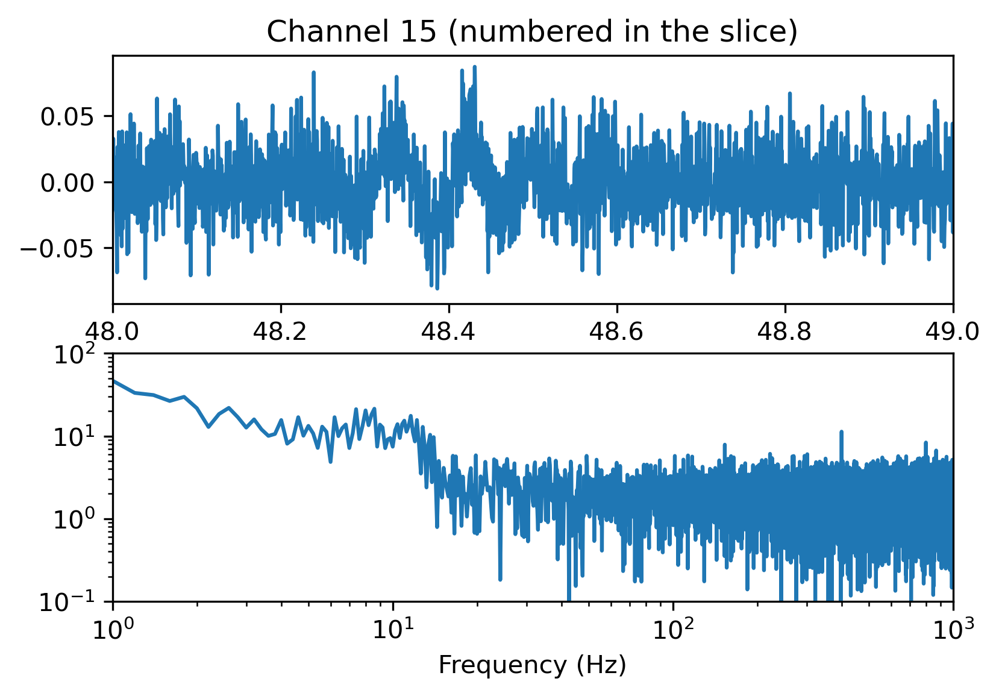

In [115]:
plt.subplots(2,1,dpi=300)
ax1=plt.subplot(211)
plt.title('Channel 15 (numbered in the slice)')
ax1.plot(t[time_slice],data_sliced[:,15])
ax1.set_xlim([48, 49])
ax2=plt.subplot(212)
ax2.loglog(f, np.abs(fftshift(fft(data_sliced_nofilt[:,15]))) )
ax2.set_xlim([1,1000])
ax2.set_ylim([0.1,100])
ax2.set_xlabel('Frequency (Hz)')

In [116]:
'''
First stab at an fk plot... needs some work
'''
# ft = fftshift(fft2(data_sliced))

# plt.subplots(dpi=300)
# c=plt.imshow(np.log10(np.abs(ft)),aspect='auto',cmap='gray_r',
#             extent=[k[0],k[-1],f[0],f[-1]])
# plt.colorbar(c)
# plt.show()

'\nFirst stab at an fk plot... needs some work\n'